In [2]:
from libraries import *
from parameters import *
from sklearn.cross_decomposition import PLSCanonical, PLSRegression, CCA
from sklearn.model_selection import cross_val_score
from numpy import asarray
from numpy import savetxt
from adjustText import adjust_text
import seaborn as sns
from sklearn.cluster import SpectralBiclustering
%matplotlib inline
import umap

In [3]:
%load_ext rpy2.ipython

In [4]:
os.getcwd()
os.chdir(projectDir)

In [37]:
coefsAll = pd.read_csv("./MixedEffectLMOutputs/ME_SignificantBetaCoefs.csv", header=0, index_col=0)
coefsAll.index = [cond.split('_')[1] for cond in coefsAll.index]

In [38]:
coefsAll

,Tram1,Rpl7,Ptp4a1,Ptpn18,Plekhb2,Cox5b,Rpl31,Rnf149,Nabp1,Cflar,...,Cd274,Ch25h,Lipa,Myof,Blnk,Pgam1,Scd2,Scd1,Nfkb2,Adra2a
Aamp,0.048,-0.225,0.034,-0.001,-0.066,0.197,-0.160,0.069,0.110,0.118,...,0.369,-0.144,0.048,0.169,0.057,-0.180,0.120,0.024,-0.091,0.012
Acaca,0.040,0.115,-0.050,0.041,-0.040,-0.005,0.049,0.029,-0.060,-0.011,...,0.034,-0.068,-0.047,-0.108,-0.025,0.070,0.680,0.548,-0.057,-0.023
Ago2,0.006,0.033,-0.006,0.104,0.226,0.031,-0.049,0.210,0.039,0.014,...,0.052,-0.074,0.149,-0.037,0.005,-0.039,0.083,-0.011,-0.002,0.020
Ahctf1,0.020,0.006,-0.005,0.001,0.051,0.038,0.100,-0.007,-0.007,0.046,...,0.132,-0.093,-0.025,-0.002,-0.045,-0.075,-0.039,-0.099,0.080,0.005
Ahr,0.046,-0.019,0.001,0.107,-0.064,0.075,0.017,0.192,-0.004,0.191,...,0.041,0.064,0.088,0.008,0.001,0.001,0.011,-0.065,0.016,-0.073
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zbtb7b,0.010,0.043,-0.046,0.004,0.161,0.034,0.035,0.008,-0.061,-0.055,...,0.124,0.091,0.022,-0.031,0.015,-0.009,0.041,-0.035,-0.045,-0.079
Zfp106,0.082,0.022,-0.098,0.019,0.051,-0.162,-0.002,-0.073,0.049,0.100,...,-0.050,-0.178,-0.067,-0.096,-0.051,-0.094,0.069,0.342,-0.099,-0.077
Zfp91,-0.045,0.012,-0.003,0.135,-0.094,-0.012,0.104,0.128,-0.028,0.092,...,-0.205,-0.079,-0.166,-0.148,-0.016,-0.020,0.023,-0.103,-0.059,-0.038
Zmiz1,0.036,0.017,0.043,0.068,0.018,-0.059,-0.095,0.115,0.074,0.081,...,0.058,-0.034,0.016,0.028,0.109,-0.011,0.029,-0.052,0.033,0.067


In [39]:
guideModules = pd.read_csv("./TextFiles/ME_GuideModules_leiden_6_Modules.csv", 
                           header=0, index_col=0)
guideModules = guideModules.loc[coefsAll.index]
guideModules

,GuideName,GuideGroup,GuideColor
Aamp,Aamp,4,#aa40fc
Acaca,Acaca,3,#d62728
Ago2,Ago2,0,#1f77b4
Ahctf1,Ahctf1,2,#279e68
Ahr,Ahr,0,#1f77b4
...,...,...,...
Zbtb7b,Zbtb7b,2,#279e68
Zfp106,Zfp106,3,#d62728
Zfp91,Zfp91,3,#d62728
Zmiz1,Zmiz1,0,#1f77b4


Generate guide modules with leiden

computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP


/tmp/ipykernel_7265/3075418528.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  koGuidesAnnDat = sc.AnnData(X=coefsAll)


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


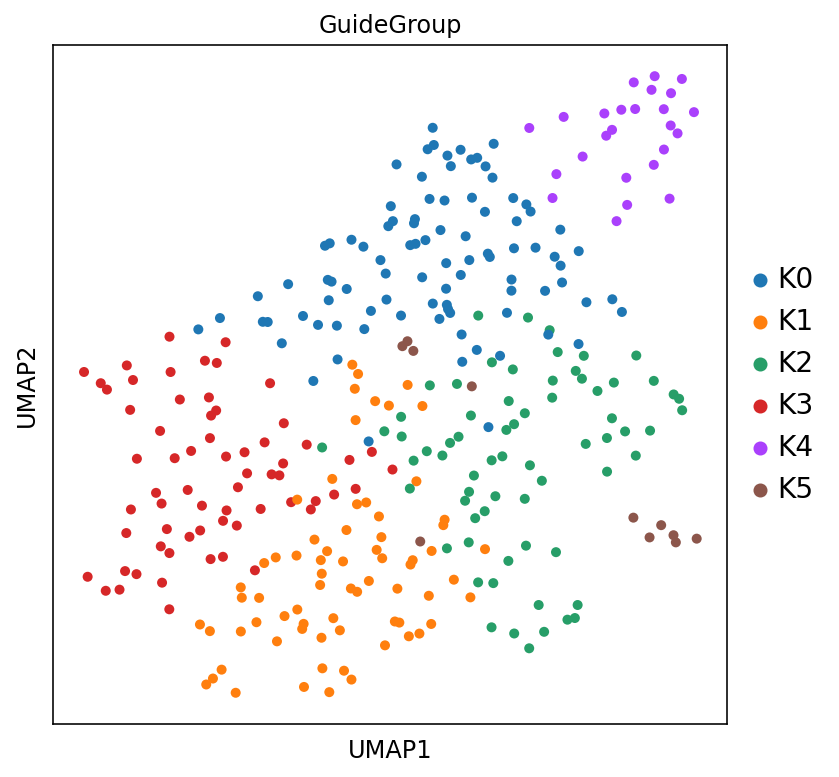

In [40]:
koGuidesAnnDat = sc.AnnData(X=coefsAll)
koGuidesAnnDat.obs["GuideGroup"] = ["K"+str(x) for x in guideModules.GuideGroup]
sc.pp.pca(koGuidesAnnDat, n_comps=50, svd_solver='arpack')
koGuidesAnnDat.obs["KOGenes"] = coefsAll.index
#sc.pp.highly_variable_genes(koGuidesAnnDat, n_top_genes=200)
sc.pp.neighbors(koGuidesAnnDat,  n_neighbors=15, metric="euclidean")
#sc.tl.leiden(koGuidesAnnDat, resolution=0.64)
sc.tl.umap(koGuidesAnnDat)

f, ax = plt.subplots(figsize=(6, 6))
sc.pl.umap(koGuidesAnnDat, color='GuideGroup',ax=ax, size=100, 
           legend_fontoutline=3, legend_fontsize=14,legend_loc='right margin',
           legend_fontweight='normal', save="Figure_2A.pdf")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_GuideGroup']`


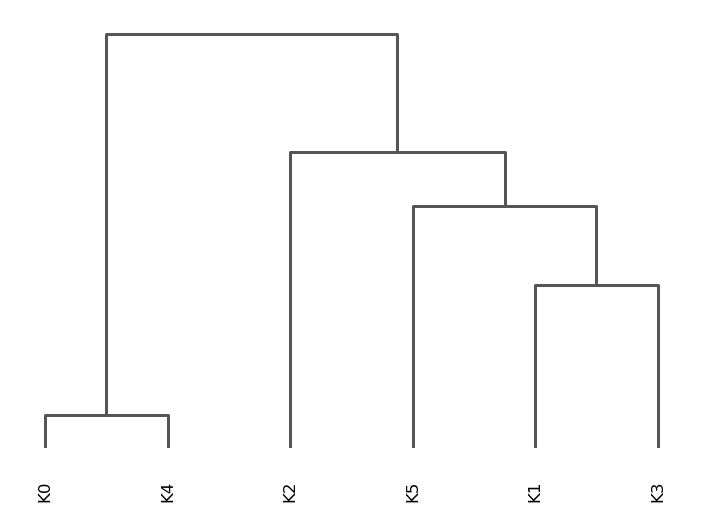

<AxesSubplot:>

In [41]:
sc.tl.dendrogram(koGuidesAnnDat, groupby='GuideGroup')
sc.pl.dendrogram(koGuidesAnnDat, groupby='GuideGroup')

In [42]:
nClust=len(koGuidesAnnDat.obs["GuideGroup"].unique())
guideModules = koGuidesAnnDat.obs[["KOGenes", "GuideGroup"]]
guideModules.columns = ["GuideName", "GuideGroup"]
guideModules

,GuideName,GuideGroup
Aamp,Aamp,K4
Acaca,Acaca,K3
Ago2,Ago2,K0
Ahctf1,Ahctf1,K2
Ahr,Ahr,K0
...,...,...
Zbtb7b,Zbtb7b,K2
Zfp106,Zfp106,K3
Zfp91,Zfp91,K3
Zmiz1,Zmiz1,K0


In [43]:
guideModules = guideModules.sort_values(["GuideGroup", "GuideName"], ascending = (True, True))

In [44]:
guideModules

,GuideName,GuideGroup
Ago2,Ago2,K0
Ahr,Ahr,K0
Anapc13,Anapc13,K0
Bach1,Bach1,K0
Baz1a,Baz1a,K0
...,...,...
Prpf4,Prpf4,K5
Sart1,Sart1,K5
Smu1,Smu1,K5
Snrnp40,Snrnp40,K5


In [45]:
guideModulesNew = pd.concat([guideModules.loc[guideModules.GuideGroup=="K4",], guideModules.loc[guideModules.GuideGroup=="K0",]])
guideModulesNew = pd.concat([guideModulesNew, guideModules.loc[guideModules.GuideGroup=="K1",]])
guideModulesNew = pd.concat([guideModulesNew, guideModules.loc[guideModules.GuideGroup=="K5",]])
guideModulesNew = pd.concat([guideModulesNew, guideModules.loc[guideModules.GuideGroup=="K3",]])
guideModulesNew = pd.concat([guideModulesNew, guideModules.loc[guideModules.GuideGroup=="K2",]])


guideModules = guideModulesNew

In [46]:
guideModules

,GuideName,GuideGroup
Aamp,Aamp,K4
Bop1,Bop1,K4
Cirh1a,Cirh1a,K4
Dcaf13,Dcaf13,K4
Grb2,Grb2,K4
...,...,...
Wdr20,Wdr20,K2
Wdr26,Wdr26,K2
Wdr33,Wdr33,K2
Zbtb17,Zbtb17,K2


In [47]:
np.corrcoef(coefsAll).shape

(329, 329)

In [48]:
guideCov = pd.DataFrame(np.corrcoef(coefsAll), index=coefsAll.index, columns=coefsAll.index)
guideCov = guideCov.loc[guideModules.GuideName,guideModules.GuideName]

In [49]:
guideModules

,GuideName,GuideGroup
Aamp,Aamp,K4
Bop1,Bop1,K4
Cirh1a,Cirh1a,K4
Dcaf13,Dcaf13,K4
Grb2,Grb2,K4
...,...,...
Wdr20,Wdr20,K2
Wdr26,Wdr26,K2
Wdr33,Wdr33,K2
Zbtb17,Zbtb17,K2


In [50]:
guideModules["GuideColor"] = ""
guideModules.loc[guideModules["GuideGroup"] == "K0", "GuideColor"] = koGuidesAnnDat.uns["GuideGroup_colors"][0]
guideModules.loc[guideModules["GuideGroup"] == "K1", "GuideColor"] = koGuidesAnnDat.uns["GuideGroup_colors"][1]
guideModules.loc[guideModules["GuideGroup"] == "K2", "GuideColor"] = koGuidesAnnDat.uns["GuideGroup_colors"][2]
guideModules.loc[guideModules["GuideGroup"] == "K3", "GuideColor"] = koGuidesAnnDat.uns["GuideGroup_colors"][3]
guideModules.loc[guideModules["GuideGroup"] == "K4", "GuideColor"] = koGuidesAnnDat.uns["GuideGroup_colors"][4]
guideModules.loc[guideModules["GuideGroup"] == "K5", "GuideColor"] = koGuidesAnnDat.uns["GuideGroup_colors"][5]

In [51]:
guideModules.GuideGroup.value_counts()

K0    91
K1    70
K2    68
K3    64
K4    25
K5    11
Name: GuideGroup, dtype: int64

In [52]:
guideModules.GuideGroup.unique()

['K4', 'K0', 'K1', 'K5', 'K3', 'K2']
Categories (6, object): ['K0', 'K1', 'K2', 'K3', 'K4', 'K5']

In [53]:
# gGroups = guideModules.GuideGroup.cat.codes
# lut = dict(zip(set(gGroups), sns.hls_palette(len(set(gGroups)), l=0.5, s=0.8)))
# row_colors = pd.DataFrame(gGroups)[0].map(lut)

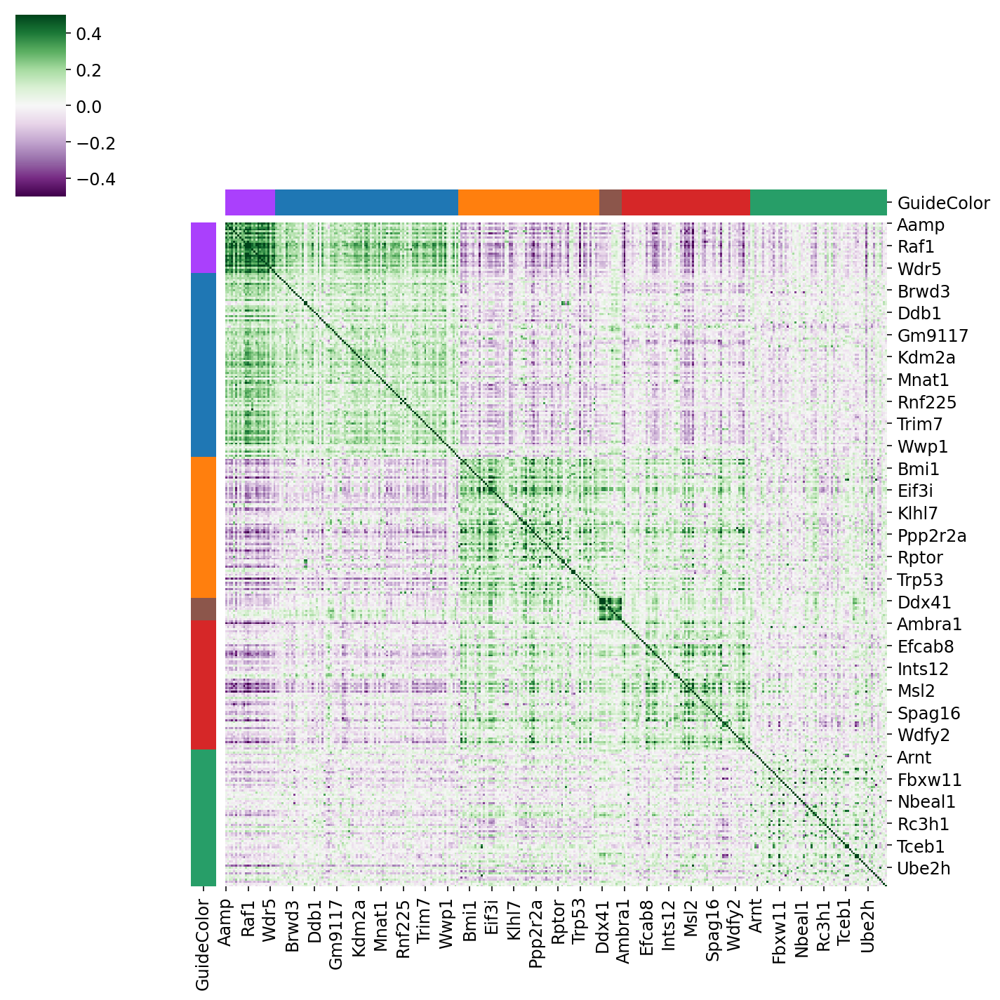

In [54]:
sns.clustermap(guideCov, row_cluster=False, col_cluster= False,
               cmap=plt.cm.PRGn, vmin=-0.5, vmax=0.5, row_colors=guideModules.GuideColor,
               col_colors=guideModules.GuideColor)
plt.savefig('Figure_2C_1.pdf', 
           dpi=300)

In [55]:

# fig = plt.figure(figsize=(8,8))
# ax = fig.add_subplot(111)
# cax = ax.matshow(guideCov, cmap=plt.cm.PRGn, vmin=-0.5, vmax=0.5, )
# fig.colorbar(cax, orientation="horizontal")

In [56]:
#guideModules.to_csv("/home/beraslan/jovian-work/analysisSingle/ME_GuideModules_leiden_"+str(nClust)+"_Modules.csv")

In [57]:
# geneModules = pd.read_csv("./TextFiles/SubClustered_GeneModules.csv", 
#                            header=0, index_col=None)

# geneModules.loc[geneModules.GeneGroup == "G7", "GeneGroup"] = "G10"
# geneModules.loc[geneModules.GeneGroup == "G6", "GeneGroup"] = "G9"
# geneModules.loc[geneModules.GeneGroup == "G5", "GeneGroup"] = "G8"
# geneModules.loc[geneModules.GeneGroup == "G4", "GeneGroup"] = "G7"
# geneModules.loc[geneModules.GeneGroup == "G3", "GeneGroup"] = "G6"
# geneModules.loc[geneModules.GeneGroup == "G2_1", "GeneGroup"] = "G5"
# geneModules.loc[geneModules.GeneGroup == "G2_0", "GeneGroup"] = "G4"
# geneModules.loc[geneModules.GeneGroup == "G1_1", "GeneGroup"] = "G3"
# geneModules.loc[geneModules.GeneGroup == "G1_0", "GeneGroup"] = "G2"
# geneModules.loc[geneModules.GeneGroup == "G0_1", "GeneGroup"] = "G1"
# geneModules.loc[geneModules.GeneGroup == "G0_0", "GeneGroup"] = "G0"

# geneModules.GeneColor = '#A6CEE3'

# geneModules.loc[geneModules.GeneGroup == "G0", "GeneColor"] = '#A6CEE3'
# geneModules.loc[geneModules.GeneGroup == "G1", "GeneColor"] = '#1F78B4'
# geneModules.loc[geneModules.GeneGroup == "G2", "GeneColor"] = '#B2DF8A'
# geneModules.loc[geneModules.GeneGroup == "G3", "GeneColor"] = '#33A02C'
# geneModules.loc[geneModules.GeneGroup == "G4", "GeneColor"] = '#FB9A99'
# geneModules.loc[geneModules.GeneGroup == "G5", "GeneColor"] = '#FDBF6F'
# geneModules.loc[geneModules.GeneGroup == "G6", "GeneColor"] = '#FF7F00'
# geneModules.loc[geneModules.GeneGroup == "G7", "GeneColor"] = '#CAB2D6'
# geneModules.loc[geneModules.GeneGroup == "G8", "GeneColor"] = '#6A3D9A'
# geneModules.loc[geneModules.GeneGroup == "G9", "GeneColor"] = '#FFFF99'
# geneModules.loc[geneModules.GeneGroup == "G10", "GeneColor"] = "#B5651D"


# #geneModules = geneModules.loc[coefsAll.columns]
# geneModules

# geneModules.to_csv("./TextFiles/ME_GeneModules_leiden_11_Modules.csv", index=False)

In [58]:
geneModules = pd.read_csv("./TextFiles/ME_GeneModules_leiden_11_Modules.csv", 
                           header=0, index_col=None)
geneModules.index= geneModules.GeneName	
geneModules = geneModules.loc[coefsAll.columns]

geneModules

,Unnamed: 0,GeneGroup,GeneColor,GeneName
Tram1,Tram1,G9,#FFFF99,Tram1
Rpl7,Rpl7,G7,#CAB2D6,Rpl7
Ptp4a1,Ptp4a1,G2,#B2DF8A,Ptp4a1
Ptpn18,Ptpn18,G1,#1F78B4,Ptpn18
Plekhb2,Plekhb2,G2,#B2DF8A,Plekhb2
...,...,...,...,...
Pgam1,Pgam1,G10,#B5651D,Pgam1
Scd2,Scd2,G4,#FB9A99,Scd2
Scd1,Scd1,G4,#FB9A99,Scd1
Nfkb2,Nfkb2,G0,#A6CEE3,Nfkb2


Generate gene modules with leiden

computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP


/tmp/ipykernel_7265/1234664151.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  koGenesAnnDat = sc.AnnData(X=coefsAll.transpose())


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


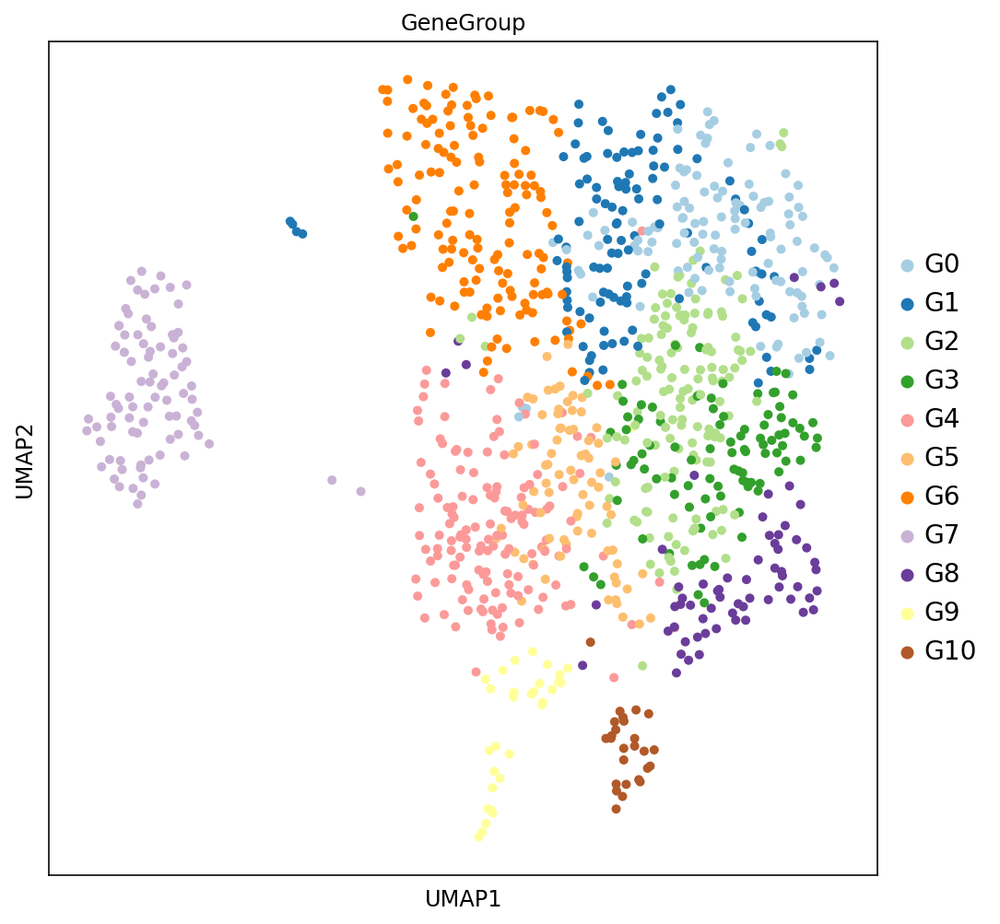

In [59]:
koGenesAnnDat = sc.AnnData(X=coefsAll.transpose())
koGenesAnnDat.obs["GeneGroup"] = [str(x) for x in geneModules.GeneGroup]
sc.pp.pca(koGenesAnnDat, n_comps=50, svd_solver='arpack')
sc.pp.neighbors(koGenesAnnDat, n_neighbors=4, metric="euclidean")
#sc.tl.leiden(koGenesAnnDat, resolution=0.8)
sc.tl.umap(koGenesAnnDat)
koGenesAnnDat.obs["EffectedGenes"] = coefsAll.columns

f, ax = plt.subplots(figsize=(8, 8))
sc.pl.umap(koGenesAnnDat, color='GeneGroup',ax=ax, size=100, palette = 'Paired', 
           legend_fontoutline=3, 
           legend_fontsize=14,legend_loc='right margin',
           legend_fontweight='normal',
          save="Figure_2B_3.pdf")

In [60]:
koGenesAnnDat.obs

,GeneGroup,EffectedGenes
Tram1,G9,Tram1
Rpl7,G7,Rpl7
Ptp4a1,G2,Ptp4a1
Ptpn18,G1,Ptpn18
Plekhb2,G2,Plekhb2
...,...,...
Pgam1,G10,Pgam1
Scd2,G4,Scd2
Scd1,G4,Scd1
Nfkb2,G0,Nfkb2


In [5]:
#geneModulesNew = pd.concat([geneModules.loc[geneModules.GeneGroup.isin(["0","1","2","4","6","7"]),], geneModules.loc[geneModules.GeneGroup.isin(["3","5"]),]])

geneModules = pd.DataFrame(pd.read_csv("./TextFiles/ME_GeneModules_leiden_11_Modules.csv", 
                           header=0, index_col=None))

geneModulesNew = pd.concat([geneModules.loc[geneModules.GeneGroup=="G6",], geneModules.loc[geneModules.GeneGroup=="G9",]])
geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="G10",]])

geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="G5",]])
geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="G4",]])
geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="G7",]])
geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="G0",]])
geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="G1",]])

geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="G3",]])
geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="G2",]])
geneModulesNew = pd.concat([geneModulesNew, geneModules.loc[geneModules.GeneGroup=="G8",]])


geneModulesNew


,Unnamed: 0,GeneGroup,GeneColor,GeneName
690,AI314180,G6,#FF7F00,AI314180
691,Abcc1,G6,#FF7F00,Abcc1
692,Acod1,G6,#FF7F00,Acod1
693,Akr1a1,G6,#FF7F00,Akr1a1
694,Alas1,G6,#FF7F00,Alas1
...,...,...,...,...
979,Socs2,G8,#6A3D9A,Socs2
980,Socs6,G8,#6A3D9A,Socs6
981,St3gal5,G8,#6A3D9A,St3gal5
982,Tmsb10,G8,#6A3D9A,Tmsb10


In [7]:
geneModulesNew.to_csv("./TextFiles/ME_GeneModules_leiden_11_Modules.csv", index=False)

In [62]:
geneModules = geneModulesNew

In [63]:
geneModules

,Unnamed: 0,GeneGroup,GeneColor,GeneName
690,AI314180,G6,#FF7F00,AI314180
691,Abcc1,G6,#FF7F00,Abcc1
692,Acod1,G6,#FF7F00,Acod1
693,Akr1a1,G6,#FF7F00,Akr1a1
694,Alas1,G6,#FF7F00,Alas1
...,...,...,...,...
979,Socs2,G8,#6A3D9A,Socs2
980,Socs6,G8,#6A3D9A,Socs6
981,St3gal5,G8,#6A3D9A,St3gal5
982,Tmsb10,G8,#6A3D9A,Tmsb10


In [64]:
geneCov = pd.DataFrame(np.corrcoef(coefsAll.transpose()), index=coefsAll.columns, columns=coefsAll.columns)
geneCov = geneCov.loc[geneModules.GeneName,geneModules.GeneName]

In [65]:
geneModules.GeneGroup.value_counts()

G6     143
G4     141
G2     141
G0     120
G1     116
G3      94
G7      86
G5      78
G8      65
G9      31
G10     26
Name: GeneGroup, dtype: int64

In [66]:
geneModules.GeneColor

690    #FF7F00
691    #FF7F00
692    #FF7F00
693    #FF7F00
694    #FF7F00
        ...   
979    #6A3D9A
980    #6A3D9A
981    #6A3D9A
982    #6A3D9A
983    #6A3D9A
Name: GeneColor, Length: 1041, dtype: object

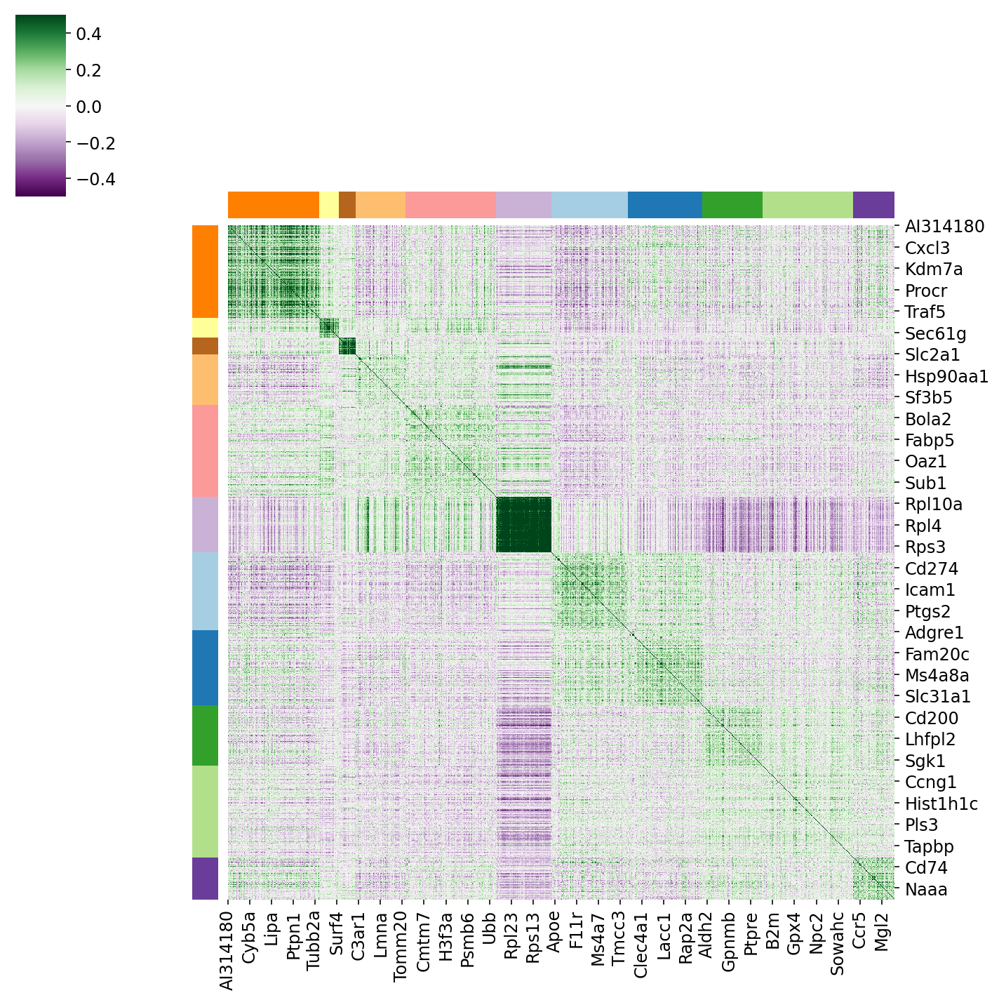

In [68]:
sns.clustermap(geneCov, row_cluster=False, col_cluster= False, cmap=plt.cm.PRGn,
               vmin=-0.5, vmax=0.5, 
               row_colors=list(geneModules.GeneColor), 
               col_colors=list(geneModules.GeneColor))

plt.savefig('Figure_2C_2.pdf', 
           dpi=300)


In [127]:
geneModules.GeneColor

690    #FF7F00
691    #FF7F00
692    #FF7F00
693    #FF7F00
694    #FF7F00
        ...   
979    #6A3D9A
980    #6A3D9A
981    #6A3D9A
982    #6A3D9A
983    #6A3D9A
Name: GeneColor, Length: 1041, dtype: object

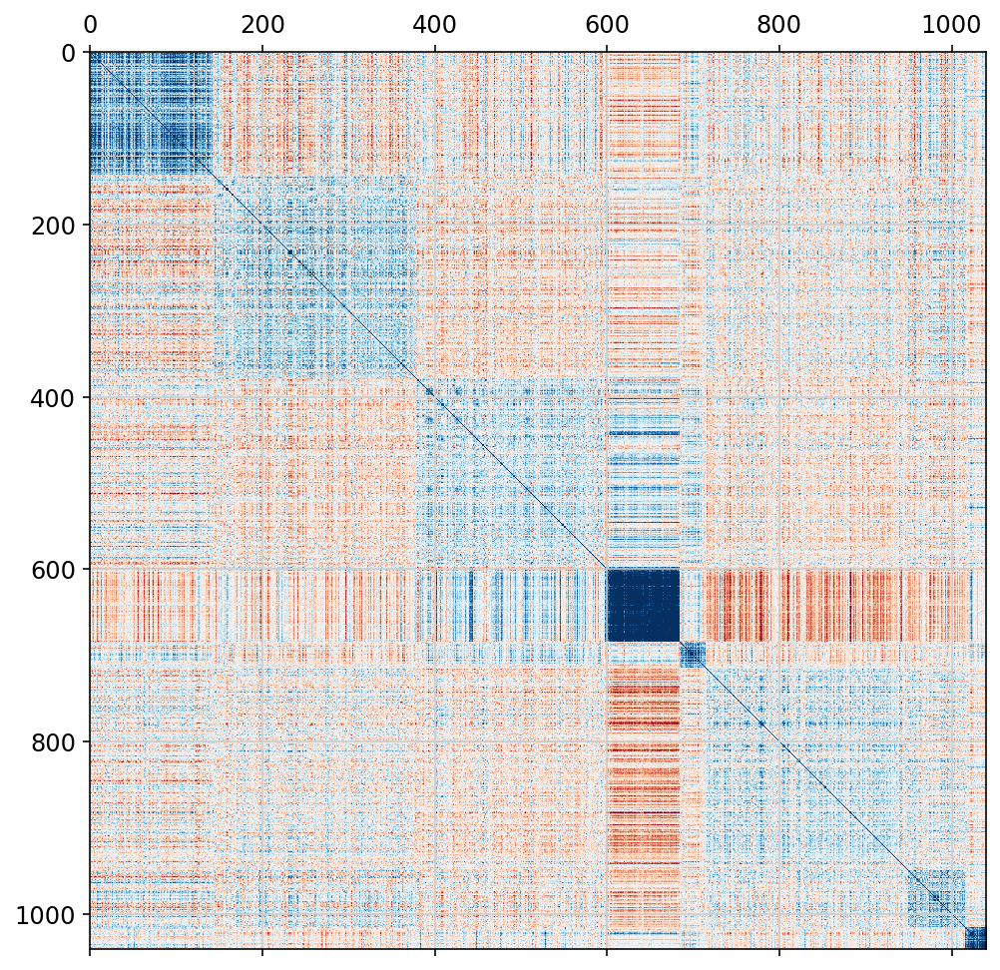

In [242]:
# fig = plt.figure(figsize=(8,8))
# ax = fig.add_subplot(111)
# cax = ax.matshow(geneCov, cmap=plt.cm.RdBu, vmin=-0.5, vmax=0.5)
#fig.colorbar(cax, orientation="horizontal")

In [323]:
#geneModules.to_csv("/home/beraslan/jovian-work/analysisSingle/ME_GeneModules_leiden_"+str(nClust)+"_Modules.csv")

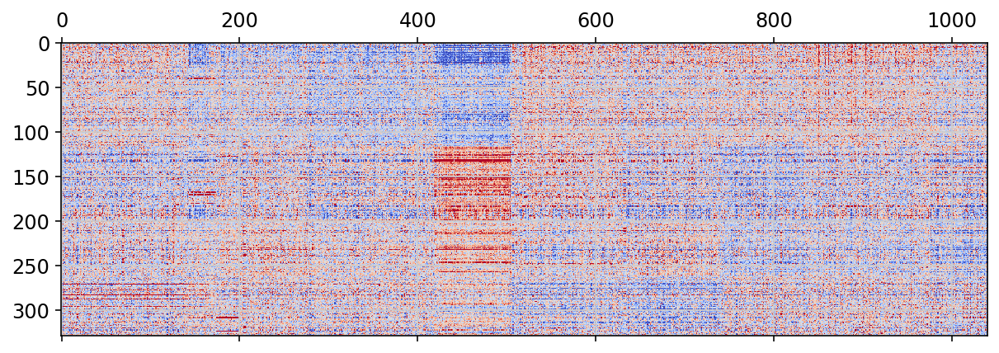

In [128]:
fig, ax = plt.subplots(figsize=(10,10))
ax.matshow(coefsAll.loc[guideCov.index, geneCov.index], cmap=plt.cm.coolwarm, vmin=-0.2, vmax=0.2)


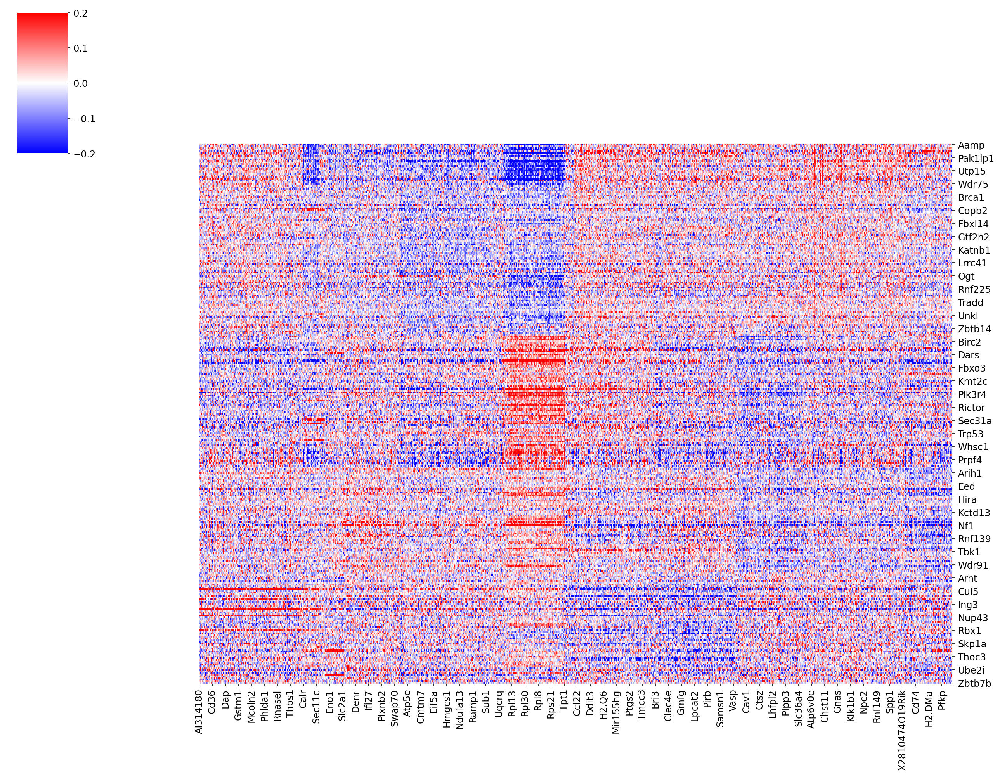

In [131]:
sns.clustermap(coefsAll.loc[guideCov.index, geneCov.index], 
               row_cluster=False, col_cluster= False, 
               cmap=plt.cm.bwr, vmin=-0.2, vmax=0.2, figsize=(18,14))
plt.savefig('Figure_2C_3.pdf', 
           dpi=300)
